In [50]:
import math
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from typing import List

import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.utils.data import Dataset, IterableDataset
from torchvision import transforms

import warnings
warnings.filterwarnings("ignore")

import os 

In [51]:
class DeviceManager():
    """
        A special class designed to store information about available devices, 
        and also has methods that can be overridden to run code on the TPU.
    """
    def __init__(self, rank, world_size, master_process, device):
        self.rank = rank
        self.world_size = world_size
        self.master_process = master_process
        self.device = device
    
    def master_print(self, str):
        if self.master_process:
            print(str)
    
    def rendezvous(self, str):
        pass

    def mark_step(self):
        torch.cuda.synchronize()
    
    def optimizer_step(self, optimizer):
        optimizer.step()
    
    def all_reduce(self, tensor):
        return tensor
    
    def save(self, checkpoint, filename):
        torch.save(checkpoint, filename)
    

class TrainParameters():
    """
    Class for storing various training hyperparameters.
    """
    def __init__(self, T, epochs, show_freq, dataset_path, shard_size, batch_size, target_image_size):
        self.T = T
        self.epochs = epochs
        self.show_freq = show_freq
        self.dataset_path = dataset_path
        self.shard_size = shard_size
        self.batch_size = batch_size
        self.target_image_size = target_image_size

        
class LearningRateScheduler():
    def __init__(self, min_lr, max_lr, warmup_steps_portion):
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.warmup_steps_portion = warmup_steps_portion
    
    def init(self, train_parameters: TrainParameters, dataset_len):
        count_steps_in_epoch = dataset_len // train_parameters.batch_size
        self.max_steps = count_steps_in_epoch * train_parameters.epochs
        self.warmup_steps = int(self.max_steps * self.warmup_steps_portion)
    
    def get_lr(self, total_iteration):
        # 1) linear warmup for warmup_iters steps
        if total_iteration < self.warmup_steps:
            return self.max_lr * (total_iteration + 1) / self.warmup_steps
        # 2) if it > lr_decay_iters, return min_lerning_rate
        if total_iteration > self.max_steps:
            return self.min_lr
        # 3) in between, use cosine decay down to min learning rate
        decay_ratio = (total_iteration - self.warmup_steps) / (self.max_steps - self.warmup_steps)
        assert 0 <= decay_ratio <= 1
        coeff = 0.5 * (1.0 + math.cos(math.pi * decay_ratio)) # coeff starts at 1 and goes to 0
        return self.min_lr + coeff * (self.max_lr - self.min_lr)

In [52]:
class CatDataset(IterableDataset):
    def __init__(self, path: str, shard_size: int, batch_size: int, target_image_size: tuple, 
                 rank: int, world_size: int, full_in_RAM:bool = False, shuffle: bool = False, allows_ex: List[str] = [".jpg", ".png", ".JPEG"]):
        self.full_in_RAM = full_in_RAM
        self.batch_size = batch_size
        self.rank = rank
        self.world_size = world_size

        self.image_paths = [os.path.join(path, name) for name in os.listdir(path) if os.path.splitext(name)[1] in allows_ex]
        self.image_paths = self.image_paths[:3]

        self.count_images = len(self.image_paths)
        self.shard_size = self.count_images if full_in_RAM else shard_size
        self.count_shards = self.count_images // shard_size

        self.transform = transforms.Compose([
            transforms.Resize(target_image_size),
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x * 2 - 1)
        ])
        
        self.reverse_transform = transforms.Compose([
            transforms.Lambda(lambda x: (x + 1) / 2),
            transforms.ToPILImage()
        ])

        if shuffle:
            np.random.shuffle(self.image_paths)
        
        if self.full_in_RAM:
            self.shard = self.get_shard(0)


    def get_shard(self, shard_n) -> torch.Tensor:
        """
        Loads a shard of images from the hard drive and then preprocesses it. 
        Shards allow processing huge datasets that do not fit entirely into RAM. 
        Preloading images also affects processing speed.
        """
        assert shard_n < self.count_shards, "shard_n has a greater value than count_shards."
        shard_start_id = shard_n * self.shard_size
        shard_image_paths = self.image_paths[shard_start_id:shard_start_id + self.shard_size]
        
        images = []
        for path in shard_image_paths:
            image = Image.open(path).convert('RGB')
            image = self.transform(image)
            images.append(image)
        
        shard_images = torch.stack(images, 0)
        return shard_images


    def __iter__(self):
        for shard_id in range(self.count_shards):
            shard_images = self.shard if self.full_in_RAM else self.get_shard(shard_id)
            image_id = self.rank * self.batch_size
            while image_id + self.batch_size <= self.shard_size:
                images_batch = shard_images[image_id:image_id + self.batch_size]
                yield images_batch
                image_id += self.world_size * self.batch_size


    def __len__(self) -> int:
        return self.count_images

def clean_folder(path: str, allows_ex: List[str]):
    """
        Filters the folder by allowed extensions.
    """
    for name in os.listdir(path):
        _, ex = os.path.splitext(name)
        if ex not in allows_ex:
            file_path = os.path.join(path, name)
            os.remove(file_path)

In [53]:
class NoiseScheduler(torch.nn.Module):
    """
    Noise generator for the image. It performs a forward pass process on diffuse model.
    """
    def __init__(self, T: int, device_manager: DeviceManager):
        super().__init__()
        self.T = T
        self.device_manager = device_manager

        self.betas = self.linear_beta_schedule(timesteps=T)
        self.alphas = 1.0 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.alphas_cumprod_prev = F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - self.alphas_cumprod)
        self.posterior_variance = self.betas * (1.0 - self.alphas_cumprod_prev) / (1.0 - self.alphas_cumprod)
    

    def linear_beta_schedule(self, timesteps, start=0.0001, end=0.02) -> torch.Tensor:
        return torch.linspace(start, end, timesteps, device=self.device_manager.device)


    def get_index_from_list(self, vals: torch.Tensor, t: torch.Tensor, x_shape: tuple) -> torch.Tensor:
        batch_size = t.shape[0]
        out = vals.gather(-1, t)
        return out.reshape(batch_size, *((1,)*(len(x_shape) - 1)))


    def forward(self, x_0, t) -> tuple[torch.Tensor, torch.Tensor]:
        noise = torch.randn_like(x_0, device=self.device_manager.device)
        sqrt_alphas_cumprod_t = self.get_index_from_list(self.sqrt_alphas_cumprod, t, x_0.shape)
        sqrt_one_minus_alphas_cumprod_t = self.get_index_from_list(self.sqrt_one_minus_alphas_cumprod, t, x_0.shape)
        return sqrt_alphas_cumprod_t * x_0 + sqrt_one_minus_alphas_cumprod_t * noise, noise


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU()
    
    def forward(self, x, t):
        h = self.bnorm(self.relu(self.conv1(x)))
        time_emb = self.relu(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None, ) * 2]
        h = h + time_emb
        h = self.bnorm(self.relu(self.conv2(h)))
        return self.transform(h)

class SinusidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
    
    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class SimpleUnet(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1
        time_emb_dim = 32
        
        # Time embedding
        self.time_mlp = nn.Sequential(
            SinusidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU()
        )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], time_emb_dim) for i in range(len(down_channels) - 1)])

        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], time_emb_dim, up=True) for i in range(len(up_channels) - 1)])

        self.output = nn.Conv2d(up_channels[-1], 3, out_dim)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)
    
    @torch.no_grad()
    def sample_timestep(self, x, t, noise_scheduler: NoiseScheduler):
        t_tensor = torch.tensor([t], device=x.device, dtype=torch.long)
        betas_t = noise_scheduler.get_index_from_list(noise_scheduler.betas, t_tensor, x.shape)
        sqrt_one_minus_alphas_cumprod_t = noise_scheduler.get_index_from_list(noise_scheduler.sqrt_one_minus_alphas_cumprod, t_tensor, x.shape)
        sqrt_recip_alphas_t = noise_scheduler.get_index_from_list(noise_scheduler.sqrt_recip_alphas, t_tensor, x.shape)

        model_mean = sqrt_recip_alphas_t * (x - betas_t * self(x, t_tensor) / sqrt_one_minus_alphas_cumprod_t)
        posterior_variance_t = noise_scheduler.get_index_from_list(noise_scheduler.posterior_variance, t_tensor, x.shape)

        if t == 0:
            return model_mean
        else:
            noise = torch.randn_like(x, device=x.device)
            return model_mean + torch.sqrt(posterior_variance_t) * noise

In [54]:
@torch.no_grad()
def show_samples(model: SimpleUnet, count_samples: int, image_size: int, device_manager: DeviceManager, noise_scheduler: NoiseScheduler, train_dataset: CatDataset):
    image = torch.randn((1, 3, image_size, image_size), device=device_manager.device)

    fig, axes = plt.subplots(1, count_samples, figsize=(15, 15))
    axes = axes.flatten()
    
    steps_to_show = noise_scheduler.T // count_samples

    for i in range(0, noise_scheduler.T)[::-1]:
        device_manager.mark_step()
        image = model.sample_timestep(image, i, noise_scheduler)
        image = torch.clamp(image, -1.0, 1.0)
        device_manager.mark_step()
        if i % steps_to_show == 0:
            image_cpu = image[0].cpu()
            if i == 0:
                device_manager.master_print(f"mean: {image_cpu.mean()}, std: {image_cpu.std()}")
            pil_image = train_dataset.reverse_transform(image_cpu)
            ax = axes[i // steps_to_show]
            ax.imshow(pil_image)
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()


def train_loop(epochs: int, show_freq: int, model: SimpleUnet, optimizer, noise_scheduler: NoiseScheduler, 
               train_dataset: CatDataset, device_manager: DeviceManager, learning_rate_scheduler: LearningRateScheduler):
    total_iteration = 0
    for epoch in range(epochs):
        for step, batch in enumerate(train_dataset):
            device_manager.mark_step()
            batch = batch.to(device_manager.device)
            optimizer.zero_grad()

            t = torch.randint(0, noise_scheduler.T, (train_dataset.batch_size, ), device=device_manager.device, dtype=torch.long)
            x_noisy, noise = noise_scheduler(batch, t)
            noise_pred = model(x_noisy, t)
            loss = F.l1_loss(noise, noise_pred)

            loss.backward()
            device_manager.optimizer_step(optimizer) # mark_step is already in use
            
            learning_rate = learning_rate_scheduler.get_lr(total_iteration)
            for param_group in optimizer.param_groups:
                    param_group['lr'] = learning_rate
            
            device_manager.master_print(f"total_iteration {total_iteration}, epoch {epoch}, step {step} | loss {loss.item()} | lr: {learning_rate:.4e}")
            if total_iteration % show_freq == 0:
                if device_manager.master_process:
                    show_samples(model, 10, batch.shape[-1], device_manager, noise_scheduler, train_dataset)
                device_manager.rendezvous("show_samples")

            total_iteration += 1


def run(device_manager: DeviceManager, train_parameters: TrainParameters, learning_rate_scheduler: LearningRateScheduler):
    noise_scheduler = NoiseScheduler(train_parameters.T, device_manager)

    train_dataset = CatDataset(train_parameters.dataset_path, train_parameters.shard_size, train_parameters.batch_size, 
                               (train_parameters.target_image_size,)*2, device_manager.rank, device_manager.world_size, full_in_RAM=True)
    
    model = SimpleUnet()
    model.to(device_manager.device)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate_scheduler.min_lr)
    
    learning_rate_scheduler.init(train_parameters, len(train_dataset))

    train_loop(train_parameters.epochs, train_parameters.show_freq, model, optimizer, noise_scheduler, train_dataset, device_manager, learning_rate_scheduler)

In [55]:
def _mp_fn(rank, flags):
    torch.manual_seed(1337)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(1337)
    
    torch.set_float32_matmul_precision('high')
    
    rank = rank
    world_size = 1
    master_process = True
    device = 'cuda'
    
    count_timesteps = 200
    epochs = 10000
    show_freq = 100
    
    dataset_path = r"data\images"
    shard_size = 1
    batch_size = 3
    target_image_size = 64
    
    min_learning_rate = 1e-3
    max_learning_rate = 1e-3
    warmup_steps_portion = 0.0
    
    device_manager = DeviceManager(rank, world_size, master_process, device)
    train_parameters = TrainParameters(count_timesteps, epochs, show_freq, dataset_path, shard_size, batch_size, target_image_size)
    learning_rate_scheduler = LearningRateScheduler(min_learning_rate, max_learning_rate, warmup_steps_portion)
    
    try:
        run(device_manager, train_parameters, learning_rate_scheduler)
    except Exception as e:
        import traceback
        print(f"\nError in process {rank}: {e}")
        traceback.print_exc()

total_iteration 0, epoch 0, step 0 | loss 0.8045353293418884 | lr: 1.0000e-03
mean: -0.017852498218417168, std: 0.6215617656707764


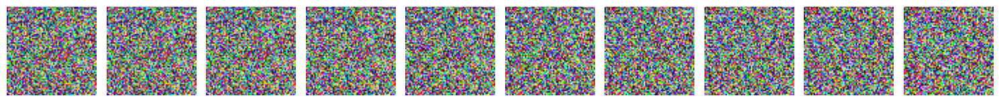

total_iteration 1, epoch 0, step 1 | loss 0.7682815194129944 | lr: 1.0000e-03
total_iteration 2, epoch 0, step 2 | loss 0.7452970147132874 | lr: 1.0000e-03
total_iteration 3, epoch 1, step 0 | loss 0.7316796183586121 | lr: 1.0000e-03
total_iteration 4, epoch 1, step 1 | loss 0.6812711358070374 | lr: 1.0000e-03
total_iteration 5, epoch 1, step 2 | loss 0.6528092622756958 | lr: 1.0000e-03
total_iteration 6, epoch 2, step 0 | loss 0.6248171925544739 | lr: 1.0000e-03
total_iteration 7, epoch 2, step 1 | loss 0.6631613969802856 | lr: 1.0000e-03
total_iteration 8, epoch 2, step 2 | loss 0.5805449485778809 | lr: 1.0000e-03
total_iteration 9, epoch 3, step 0 | loss 0.639985203742981 | lr: 1.0000e-03
total_iteration 10, epoch 3, step 1 | loss 0.532027542591095 | lr: 1.0000e-03
total_iteration 11, epoch 3, step 2 | loss 0.5324452519416809 | lr: 1.0000e-03
total_iteration 12, epoch 4, step 0 | loss 0.4937793016433716 | lr: 1.0000e-03
total_iteration 13, epoch 4, step 1 | loss 0.47973358631134033 

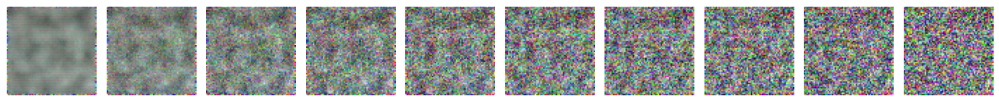

total_iteration 101, epoch 33, step 2 | loss 0.4059438109397888 | lr: 1.0000e-03
total_iteration 102, epoch 34, step 0 | loss 0.37930828332901 | lr: 1.0000e-03
total_iteration 103, epoch 34, step 1 | loss 0.2403951734304428 | lr: 1.0000e-03
total_iteration 104, epoch 34, step 2 | loss 0.21097727119922638 | lr: 1.0000e-03
total_iteration 105, epoch 35, step 0 | loss 0.2691161632537842 | lr: 1.0000e-03
total_iteration 106, epoch 35, step 1 | loss 0.27448001503944397 | lr: 1.0000e-03
total_iteration 107, epoch 35, step 2 | loss 0.21929089725017548 | lr: 1.0000e-03
total_iteration 108, epoch 36, step 0 | loss 0.2060265839099884 | lr: 1.0000e-03
total_iteration 109, epoch 36, step 1 | loss 0.251376211643219 | lr: 1.0000e-03
total_iteration 110, epoch 36, step 2 | loss 0.3282574713230133 | lr: 1.0000e-03
total_iteration 111, epoch 37, step 0 | loss 0.19069579243659973 | lr: 1.0000e-03
total_iteration 112, epoch 37, step 1 | loss 0.2186679095029831 | lr: 1.0000e-03
total_iteration 113, epoch 

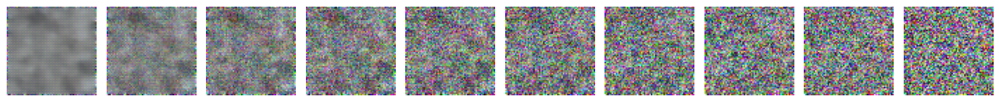

total_iteration 201, epoch 67, step 0 | loss 0.3058607280254364 | lr: 1.0000e-03
total_iteration 202, epoch 67, step 1 | loss 0.2343510538339615 | lr: 1.0000e-03
total_iteration 203, epoch 67, step 2 | loss 0.23558326065540314 | lr: 1.0000e-03
total_iteration 204, epoch 68, step 0 | loss 0.1791222095489502 | lr: 1.0000e-03
total_iteration 205, epoch 68, step 1 | loss 0.2534635663032532 | lr: 1.0000e-03
total_iteration 206, epoch 68, step 2 | loss 0.1805419772863388 | lr: 1.0000e-03
total_iteration 207, epoch 69, step 0 | loss 0.198673278093338 | lr: 1.0000e-03
total_iteration 208, epoch 69, step 1 | loss 0.21764379739761353 | lr: 1.0000e-03
total_iteration 209, epoch 69, step 2 | loss 0.1925281137228012 | lr: 1.0000e-03
total_iteration 210, epoch 70, step 0 | loss 0.3052345812320709 | lr: 1.0000e-03
total_iteration 211, epoch 70, step 1 | loss 0.24074342846870422 | lr: 1.0000e-03
total_iteration 212, epoch 70, step 2 | loss 0.21572859585285187 | lr: 1.0000e-03
total_iteration 213, epoc

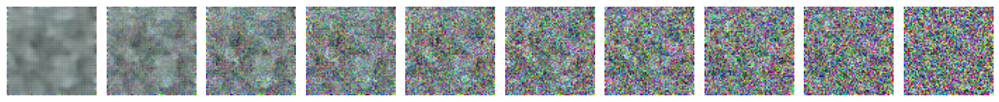

total_iteration 301, epoch 100, step 1 | loss 0.23600029945373535 | lr: 1.0000e-03
total_iteration 302, epoch 100, step 2 | loss 0.1858505755662918 | lr: 1.0000e-03
total_iteration 303, epoch 101, step 0 | loss 0.17744596302509308 | lr: 1.0000e-03
total_iteration 304, epoch 101, step 1 | loss 0.2258995622396469 | lr: 1.0000e-03
total_iteration 305, epoch 101, step 2 | loss 0.22386588156223297 | lr: 1.0000e-03
total_iteration 306, epoch 102, step 0 | loss 0.18028756976127625 | lr: 1.0000e-03
total_iteration 307, epoch 102, step 1 | loss 0.26274314522743225 | lr: 1.0000e-03
total_iteration 308, epoch 102, step 2 | loss 0.2197185605764389 | lr: 1.0000e-03
total_iteration 309, epoch 103, step 0 | loss 0.19994230568408966 | lr: 1.0000e-03
total_iteration 310, epoch 103, step 1 | loss 0.2684086859226227 | lr: 1.0000e-03
total_iteration 311, epoch 103, step 2 | loss 0.2008255273103714 | lr: 1.0000e-03
total_iteration 312, epoch 104, step 0 | loss 0.21543820202350616 | lr: 1.0000e-03
total_ite

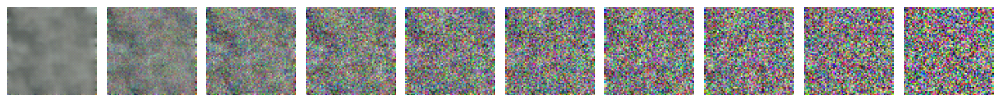

total_iteration 401, epoch 133, step 2 | loss 0.18950669467449188 | lr: 1.0000e-03
total_iteration 402, epoch 134, step 0 | loss 0.19230087101459503 | lr: 1.0000e-03
total_iteration 403, epoch 134, step 1 | loss 0.19441252946853638 | lr: 1.0000e-03
total_iteration 404, epoch 134, step 2 | loss 0.18363653123378754 | lr: 1.0000e-03
total_iteration 405, epoch 135, step 0 | loss 0.19501574337482452 | lr: 1.0000e-03
total_iteration 406, epoch 135, step 1 | loss 0.36522361636161804 | lr: 1.0000e-03
total_iteration 407, epoch 135, step 2 | loss 0.42551934719085693 | lr: 1.0000e-03
total_iteration 408, epoch 136, step 0 | loss 0.1635999232530594 | lr: 1.0000e-03
total_iteration 409, epoch 136, step 1 | loss 0.22527970373630524 | lr: 1.0000e-03
total_iteration 410, epoch 136, step 2 | loss 0.1489080786705017 | lr: 1.0000e-03
total_iteration 411, epoch 137, step 0 | loss 0.2102179080247879 | lr: 1.0000e-03
total_iteration 412, epoch 137, step 1 | loss 0.3519327938556671 | lr: 1.0000e-03
total_it

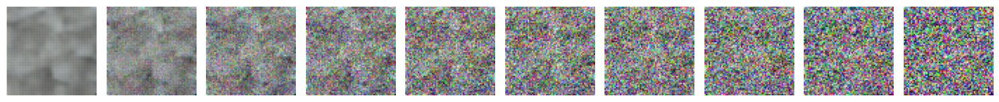

total_iteration 501, epoch 167, step 0 | loss 0.1447649598121643 | lr: 1.0000e-03
total_iteration 502, epoch 167, step 1 | loss 0.269029825925827 | lr: 1.0000e-03
total_iteration 503, epoch 167, step 2 | loss 0.1670963317155838 | lr: 1.0000e-03
total_iteration 504, epoch 168, step 0 | loss 0.18726086616516113 | lr: 1.0000e-03
total_iteration 505, epoch 168, step 1 | loss 0.2030988335609436 | lr: 1.0000e-03
total_iteration 506, epoch 168, step 2 | loss 0.15491776168346405 | lr: 1.0000e-03
total_iteration 507, epoch 169, step 0 | loss 0.2804686725139618 | lr: 1.0000e-03
total_iteration 508, epoch 169, step 1 | loss 0.1757226437330246 | lr: 1.0000e-03
total_iteration 509, epoch 169, step 2 | loss 0.2651553153991699 | lr: 1.0000e-03
total_iteration 510, epoch 170, step 0 | loss 0.300315797328949 | lr: 1.0000e-03
total_iteration 511, epoch 170, step 1 | loss 0.1403457373380661 | lr: 1.0000e-03
total_iteration 512, epoch 170, step 2 | loss 0.1348254680633545 | lr: 1.0000e-03
total_iteration 

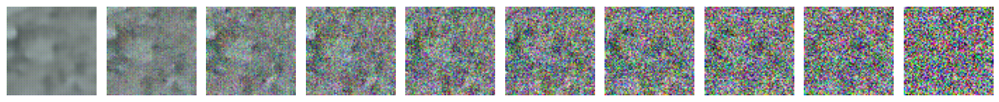

total_iteration 601, epoch 200, step 1 | loss 0.2125621885061264 | lr: 1.0000e-03
total_iteration 602, epoch 200, step 2 | loss 0.157246932387352 | lr: 1.0000e-03
total_iteration 603, epoch 201, step 0 | loss 0.2088770568370819 | lr: 1.0000e-03
total_iteration 604, epoch 201, step 1 | loss 0.2693538963794708 | lr: 1.0000e-03
total_iteration 605, epoch 201, step 2 | loss 0.27028360962867737 | lr: 1.0000e-03
total_iteration 606, epoch 202, step 0 | loss 0.23930682241916656 | lr: 1.0000e-03
total_iteration 607, epoch 202, step 1 | loss 0.18628983199596405 | lr: 1.0000e-03
total_iteration 608, epoch 202, step 2 | loss 0.19191429018974304 | lr: 1.0000e-03
total_iteration 609, epoch 203, step 0 | loss 0.15234334766864777 | lr: 1.0000e-03
total_iteration 610, epoch 203, step 1 | loss 0.13730239868164062 | lr: 1.0000e-03
total_iteration 611, epoch 203, step 2 | loss 0.1373797208070755 | lr: 1.0000e-03
total_iteration 612, epoch 204, step 0 | loss 0.14855922758579254 | lr: 1.0000e-03
total_iter

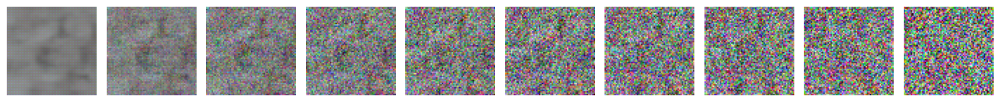

total_iteration 701, epoch 233, step 2 | loss 0.14573635160923004 | lr: 1.0000e-03
total_iteration 702, epoch 234, step 0 | loss 0.15372620522975922 | lr: 1.0000e-03
total_iteration 703, epoch 234, step 1 | loss 0.251669317483902 | lr: 1.0000e-03
total_iteration 704, epoch 234, step 2 | loss 0.21872557699680328 | lr: 1.0000e-03
total_iteration 705, epoch 235, step 0 | loss 0.14478464424610138 | lr: 1.0000e-03
total_iteration 706, epoch 235, step 1 | loss 0.1546117514371872 | lr: 1.0000e-03
total_iteration 707, epoch 235, step 2 | loss 0.12866374850273132 | lr: 1.0000e-03
total_iteration 708, epoch 236, step 0 | loss 0.2397950440645218 | lr: 1.0000e-03
total_iteration 709, epoch 236, step 1 | loss 0.17937207221984863 | lr: 1.0000e-03
total_iteration 710, epoch 236, step 2 | loss 0.28612014651298523 | lr: 1.0000e-03
total_iteration 711, epoch 237, step 0 | loss 0.1326255351305008 | lr: 1.0000e-03
total_iteration 712, epoch 237, step 1 | loss 0.17001135647296906 | lr: 1.0000e-03
total_ite

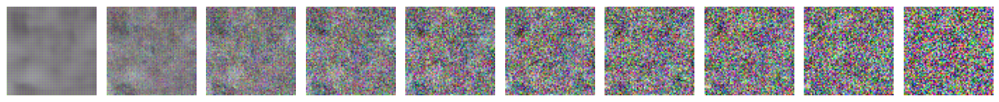

total_iteration 801, epoch 267, step 0 | loss 0.3351520597934723 | lr: 1.0000e-03
total_iteration 802, epoch 267, step 1 | loss 0.219859316945076 | lr: 1.0000e-03
total_iteration 803, epoch 267, step 2 | loss 0.2806859612464905 | lr: 1.0000e-03
total_iteration 804, epoch 268, step 0 | loss 0.16286444664001465 | lr: 1.0000e-03
total_iteration 805, epoch 268, step 1 | loss 0.17557759582996368 | lr: 1.0000e-03
total_iteration 806, epoch 268, step 2 | loss 0.2107626348733902 | lr: 1.0000e-03
total_iteration 807, epoch 269, step 0 | loss 0.3636983335018158 | lr: 1.0000e-03
total_iteration 808, epoch 269, step 1 | loss 0.21243372559547424 | lr: 1.0000e-03
total_iteration 809, epoch 269, step 2 | loss 0.1882925033569336 | lr: 1.0000e-03
total_iteration 810, epoch 270, step 0 | loss 0.12982642650604248 | lr: 1.0000e-03
total_iteration 811, epoch 270, step 1 | loss 0.20924030244350433 | lr: 1.0000e-03
total_iteration 812, epoch 270, step 2 | loss 0.1551557183265686 | lr: 1.0000e-03
total_iterat

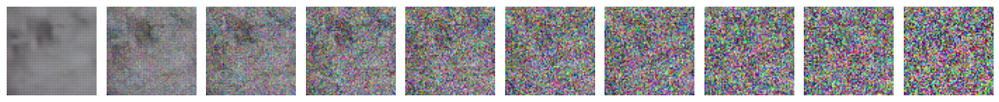

total_iteration 901, epoch 300, step 1 | loss 0.23700305819511414 | lr: 1.0000e-03
total_iteration 902, epoch 300, step 2 | loss 0.1510772705078125 | lr: 1.0000e-03
total_iteration 903, epoch 301, step 0 | loss 0.21610867977142334 | lr: 1.0000e-03
total_iteration 904, epoch 301, step 1 | loss 0.1424698531627655 | lr: 1.0000e-03
total_iteration 905, epoch 301, step 2 | loss 0.12454652786254883 | lr: 1.0000e-03
total_iteration 906, epoch 302, step 0 | loss 0.13479143381118774 | lr: 1.0000e-03
total_iteration 907, epoch 302, step 1 | loss 0.26686975359916687 | lr: 1.0000e-03
total_iteration 908, epoch 302, step 2 | loss 0.2183978110551834 | lr: 1.0000e-03
total_iteration 909, epoch 303, step 0 | loss 0.17629627883434296 | lr: 1.0000e-03
total_iteration 910, epoch 303, step 1 | loss 0.27239730954170227 | lr: 1.0000e-03
total_iteration 911, epoch 303, step 2 | loss 0.2382330596446991 | lr: 1.0000e-03
total_iteration 912, epoch 304, step 0 | loss 0.13907936215400696 | lr: 1.0000e-03
total_it

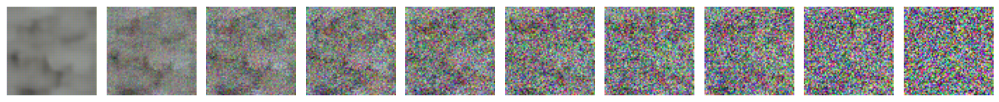

total_iteration 1001, epoch 333, step 2 | loss 0.16243641078472137 | lr: 1.0000e-03
total_iteration 1002, epoch 334, step 0 | loss 0.16910217702388763 | lr: 1.0000e-03
total_iteration 1003, epoch 334, step 1 | loss 0.13854406774044037 | lr: 1.0000e-03
total_iteration 1004, epoch 334, step 2 | loss 0.12488409131765366 | lr: 1.0000e-03
total_iteration 1005, epoch 335, step 0 | loss 0.12886111438274384 | lr: 1.0000e-03
total_iteration 1006, epoch 335, step 1 | loss 0.14582613110542297 | lr: 1.0000e-03
total_iteration 1007, epoch 335, step 2 | loss 0.27865293622016907 | lr: 1.0000e-03
total_iteration 1008, epoch 336, step 0 | loss 0.13388663530349731 | lr: 1.0000e-03
total_iteration 1009, epoch 336, step 1 | loss 0.17615501582622528 | lr: 1.0000e-03
total_iteration 1010, epoch 336, step 2 | loss 0.17873072624206543 | lr: 1.0000e-03
total_iteration 1011, epoch 337, step 0 | loss 0.1871470957994461 | lr: 1.0000e-03
total_iteration 1012, epoch 337, step 1 | loss 0.1586424857378006 | lr: 1.000

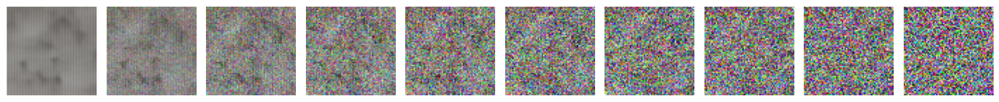

total_iteration 1101, epoch 367, step 0 | loss 0.13628144562244415 | lr: 1.0000e-03
total_iteration 1102, epoch 367, step 1 | loss 0.1980714350938797 | lr: 1.0000e-03
total_iteration 1103, epoch 367, step 2 | loss 0.14057357609272003 | lr: 1.0000e-03
total_iteration 1104, epoch 368, step 0 | loss 0.21912892162799835 | lr: 1.0000e-03
total_iteration 1105, epoch 368, step 1 | loss 0.2208671271800995 | lr: 1.0000e-03
total_iteration 1106, epoch 368, step 2 | loss 0.16282422840595245 | lr: 1.0000e-03
total_iteration 1107, epoch 369, step 0 | loss 0.3010622560977936 | lr: 1.0000e-03
total_iteration 1108, epoch 369, step 1 | loss 0.31588760018348694 | lr: 1.0000e-03
total_iteration 1109, epoch 369, step 2 | loss 0.35633787512779236 | lr: 1.0000e-03
total_iteration 1110, epoch 370, step 0 | loss 0.13284870982170105 | lr: 1.0000e-03
total_iteration 1111, epoch 370, step 1 | loss 0.2026004046201706 | lr: 1.0000e-03
total_iteration 1112, epoch 370, step 2 | loss 0.14168871939182281 | lr: 1.0000e

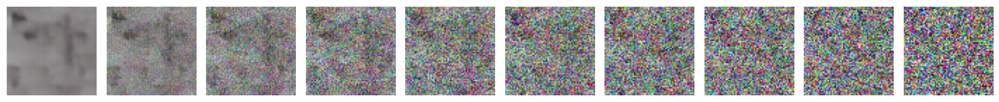

total_iteration 1201, epoch 400, step 1 | loss 0.18117381632328033 | lr: 1.0000e-03
total_iteration 1202, epoch 400, step 2 | loss 0.3735373020172119 | lr: 1.0000e-03
total_iteration 1203, epoch 401, step 0 | loss 0.11789967119693756 | lr: 1.0000e-03
total_iteration 1204, epoch 401, step 1 | loss 0.11677323281764984 | lr: 1.0000e-03
total_iteration 1205, epoch 401, step 2 | loss 0.2221074402332306 | lr: 1.0000e-03
total_iteration 1206, epoch 402, step 0 | loss 0.1491042822599411 | lr: 1.0000e-03
total_iteration 1207, epoch 402, step 1 | loss 0.1810951977968216 | lr: 1.0000e-03
total_iteration 1208, epoch 402, step 2 | loss 0.2261016070842743 | lr: 1.0000e-03
total_iteration 1209, epoch 403, step 0 | loss 0.13289782404899597 | lr: 1.0000e-03
total_iteration 1210, epoch 403, step 1 | loss 0.13360224664211273 | lr: 1.0000e-03
total_iteration 1211, epoch 403, step 2 | loss 0.25920382142066956 | lr: 1.0000e-03
total_iteration 1212, epoch 404, step 0 | loss 0.1466440111398697 | lr: 1.0000e-0

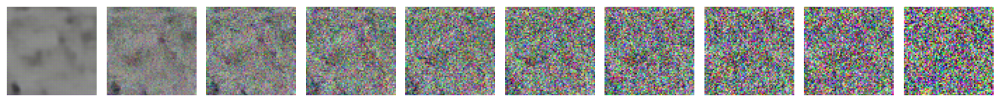

total_iteration 1301, epoch 433, step 2 | loss 0.34431588649749756 | lr: 1.0000e-03
total_iteration 1302, epoch 434, step 0 | loss 0.20504184067249298 | lr: 1.0000e-03
total_iteration 1303, epoch 434, step 1 | loss 0.16877257823944092 | lr: 1.0000e-03
total_iteration 1304, epoch 434, step 2 | loss 0.1900610476732254 | lr: 1.0000e-03
total_iteration 1305, epoch 435, step 0 | loss 0.16976864635944366 | lr: 1.0000e-03
total_iteration 1306, epoch 435, step 1 | loss 0.19795924425125122 | lr: 1.0000e-03
total_iteration 1307, epoch 435, step 2 | loss 0.13255755603313446 | lr: 1.0000e-03
total_iteration 1308, epoch 436, step 0 | loss 0.13626240193843842 | lr: 1.0000e-03
total_iteration 1309, epoch 436, step 1 | loss 0.12740473449230194 | lr: 1.0000e-03
total_iteration 1310, epoch 436, step 2 | loss 0.13236960768699646 | lr: 1.0000e-03
total_iteration 1311, epoch 437, step 0 | loss 0.15778599679470062 | lr: 1.0000e-03
total_iteration 1312, epoch 437, step 1 | loss 0.24729619920253754 | lr: 1.00

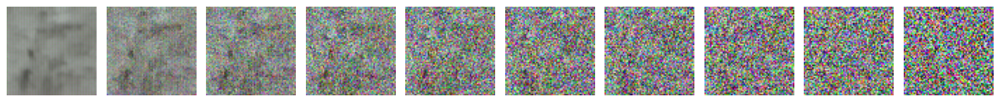

total_iteration 1401, epoch 467, step 0 | loss 0.3459625840187073 | lr: 1.0000e-03
total_iteration 1402, epoch 467, step 1 | loss 0.22709904611110687 | lr: 1.0000e-03
total_iteration 1403, epoch 467, step 2 | loss 0.13401035964488983 | lr: 1.0000e-03
total_iteration 1404, epoch 468, step 0 | loss 0.1619686335325241 | lr: 1.0000e-03
total_iteration 1405, epoch 468, step 1 | loss 0.13636326789855957 | lr: 1.0000e-03
total_iteration 1406, epoch 468, step 2 | loss 0.11704906076192856 | lr: 1.0000e-03
total_iteration 1407, epoch 469, step 0 | loss 0.14922842383384705 | lr: 1.0000e-03
total_iteration 1408, epoch 469, step 1 | loss 0.1358821839094162 | lr: 1.0000e-03
total_iteration 1409, epoch 469, step 2 | loss 0.21172966063022614 | lr: 1.0000e-03
total_iteration 1410, epoch 470, step 0 | loss 0.2096118927001953 | lr: 1.0000e-03
total_iteration 1411, epoch 470, step 1 | loss 0.13139094412326813 | lr: 1.0000e-03
total_iteration 1412, epoch 470, step 2 | loss 0.1816672831773758 | lr: 1.0000e-

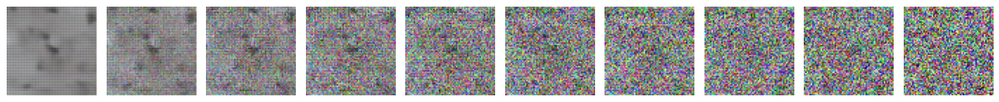

total_iteration 1501, epoch 500, step 1 | loss 0.12044313549995422 | lr: 1.0000e-03
total_iteration 1502, epoch 500, step 2 | loss 0.2968662679195404 | lr: 1.0000e-03
total_iteration 1503, epoch 501, step 0 | loss 0.12450170516967773 | lr: 1.0000e-03
total_iteration 1504, epoch 501, step 1 | loss 0.16811779141426086 | lr: 1.0000e-03
total_iteration 1505, epoch 501, step 2 | loss 0.3193131685256958 | lr: 1.0000e-03
total_iteration 1506, epoch 502, step 0 | loss 0.13893413543701172 | lr: 1.0000e-03
total_iteration 1507, epoch 502, step 1 | loss 0.17090800404548645 | lr: 1.0000e-03
total_iteration 1508, epoch 502, step 2 | loss 0.1892552375793457 | lr: 1.0000e-03
total_iteration 1509, epoch 503, step 0 | loss 0.2029636651277542 | lr: 1.0000e-03
total_iteration 1510, epoch 503, step 1 | loss 0.1395353525876999 | lr: 1.0000e-03
total_iteration 1511, epoch 503, step 2 | loss 0.16793280839920044 | lr: 1.0000e-03
total_iteration 1512, epoch 504, step 0 | loss 0.13514728844165802 | lr: 1.0000e-

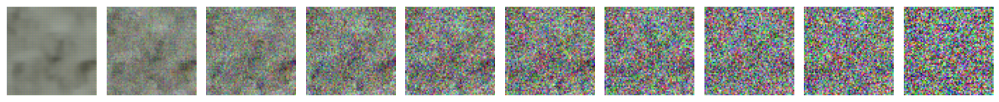

total_iteration 1601, epoch 533, step 2 | loss 0.21846754848957062 | lr: 1.0000e-03
total_iteration 1602, epoch 534, step 0 | loss 0.1428895741701126 | lr: 1.0000e-03
total_iteration 1603, epoch 534, step 1 | loss 0.13311682641506195 | lr: 1.0000e-03
total_iteration 1604, epoch 534, step 2 | loss 0.1506241261959076 | lr: 1.0000e-03
total_iteration 1605, epoch 535, step 0 | loss 0.1583242118358612 | lr: 1.0000e-03
total_iteration 1606, epoch 535, step 1 | loss 0.21619558334350586 | lr: 1.0000e-03
total_iteration 1607, epoch 535, step 2 | loss 0.12807899713516235 | lr: 1.0000e-03
total_iteration 1608, epoch 536, step 0 | loss 0.13920047879219055 | lr: 1.0000e-03
total_iteration 1609, epoch 536, step 1 | loss 0.11571004986763 | lr: 1.0000e-03
total_iteration 1610, epoch 536, step 2 | loss 0.22199243307113647 | lr: 1.0000e-03
total_iteration 1611, epoch 537, step 0 | loss 0.13525672256946564 | lr: 1.0000e-03
total_iteration 1612, epoch 537, step 1 | loss 0.19471493363380432 | lr: 1.0000e-0

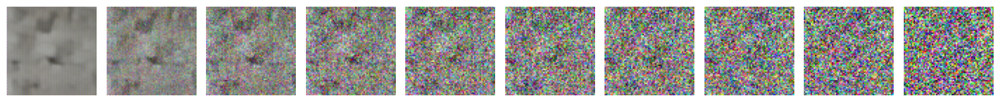

total_iteration 1701, epoch 567, step 0 | loss 0.2144857794046402 | lr: 1.0000e-03
total_iteration 1702, epoch 567, step 1 | loss 0.29211902618408203 | lr: 1.0000e-03
total_iteration 1703, epoch 567, step 2 | loss 0.15796038508415222 | lr: 1.0000e-03
total_iteration 1704, epoch 568, step 0 | loss 0.1904420107603073 | lr: 1.0000e-03
total_iteration 1705, epoch 568, step 1 | loss 0.1966559886932373 | lr: 1.0000e-03
total_iteration 1706, epoch 568, step 2 | loss 0.28711071610450745 | lr: 1.0000e-03
total_iteration 1707, epoch 569, step 0 | loss 0.35810819268226624 | lr: 1.0000e-03
total_iteration 1708, epoch 569, step 1 | loss 0.18904301524162292 | lr: 1.0000e-03
total_iteration 1709, epoch 569, step 2 | loss 0.12259940057992935 | lr: 1.0000e-03
total_iteration 1710, epoch 570, step 0 | loss 0.18834568560123444 | lr: 1.0000e-03
total_iteration 1711, epoch 570, step 1 | loss 0.15667635202407837 | lr: 1.0000e-03
total_iteration 1712, epoch 570, step 2 | loss 0.23240157961845398 | lr: 1.0000

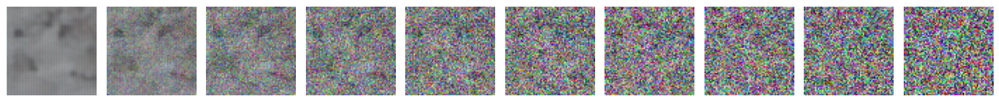

total_iteration 1801, epoch 600, step 1 | loss 0.11710810661315918 | lr: 1.0000e-03
total_iteration 1802, epoch 600, step 2 | loss 0.15368883311748505 | lr: 1.0000e-03
total_iteration 1803, epoch 601, step 0 | loss 0.2856529951095581 | lr: 1.0000e-03
total_iteration 1804, epoch 601, step 1 | loss 0.11077360063791275 | lr: 1.0000e-03
total_iteration 1805, epoch 601, step 2 | loss 0.14091593027114868 | lr: 1.0000e-03
total_iteration 1806, epoch 602, step 0 | loss 0.17570169270038605 | lr: 1.0000e-03
total_iteration 1807, epoch 602, step 1 | loss 0.1522187441587448 | lr: 1.0000e-03
total_iteration 1808, epoch 602, step 2 | loss 0.15671242773532867 | lr: 1.0000e-03
total_iteration 1809, epoch 603, step 0 | loss 0.5661847591400146 | lr: 1.0000e-03
total_iteration 1810, epoch 603, step 1 | loss 0.12473189830780029 | lr: 1.0000e-03
total_iteration 1811, epoch 603, step 2 | loss 0.27353230118751526 | lr: 1.0000e-03
total_iteration 1812, epoch 604, step 0 | loss 0.22758616507053375 | lr: 1.0000

In [56]:
flags={}
_mp_fn(0, flags)